Starting Training...


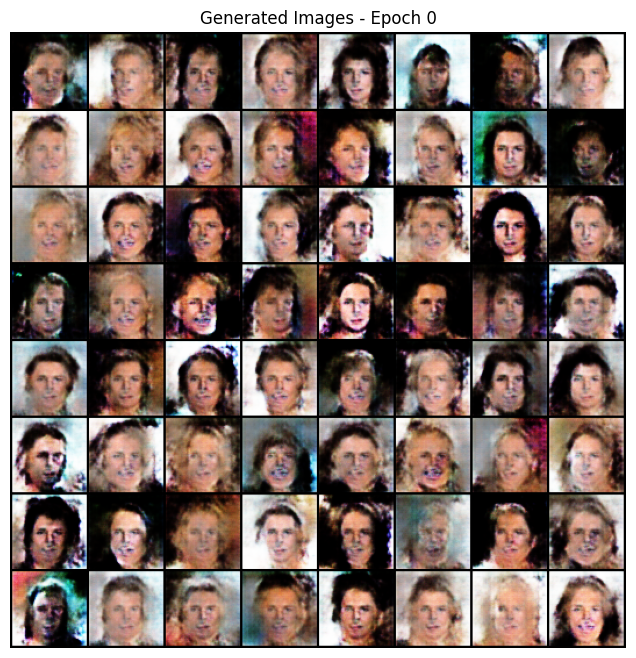

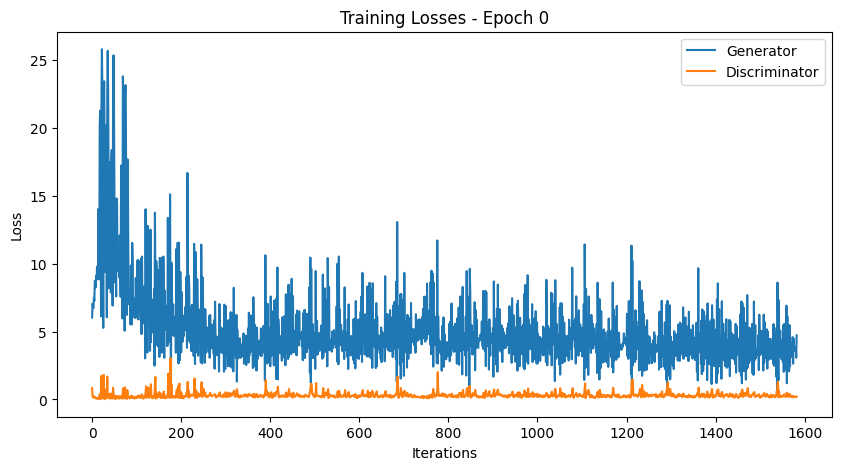

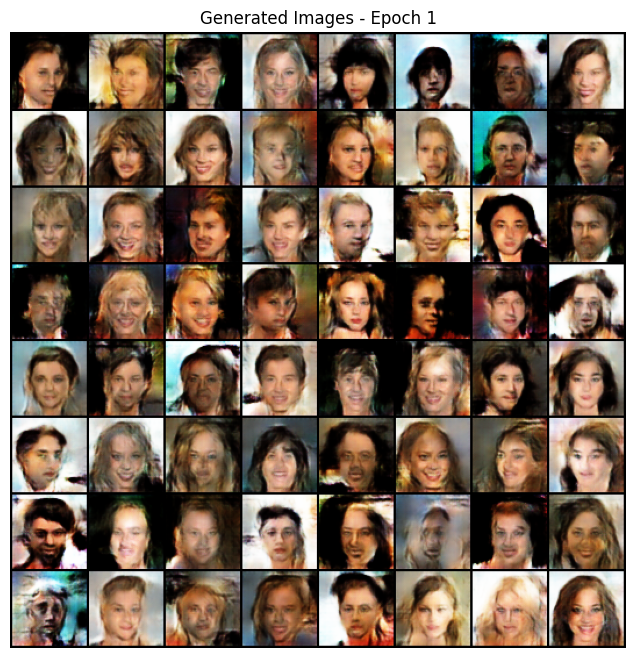

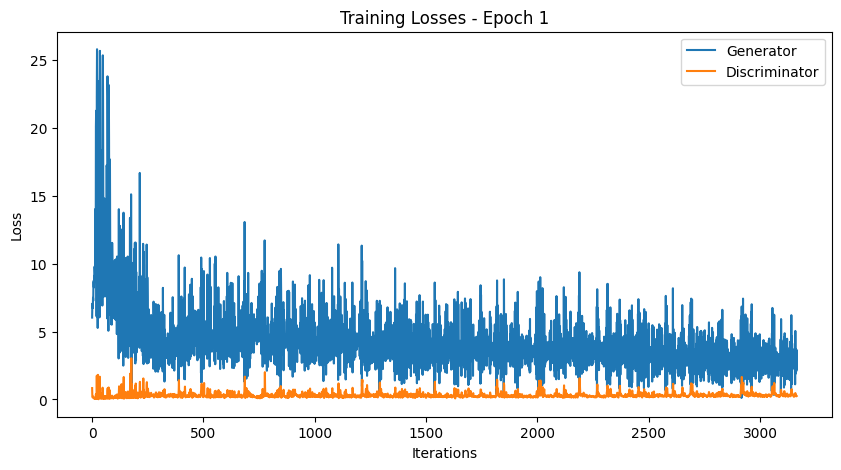

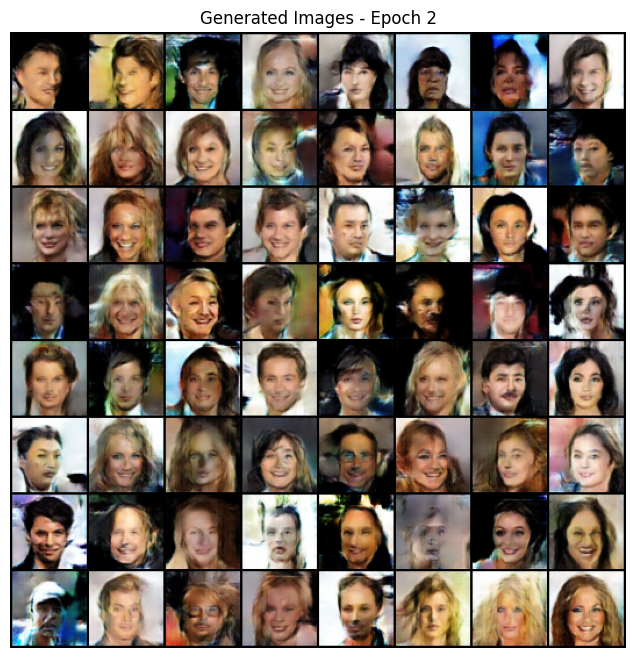

...

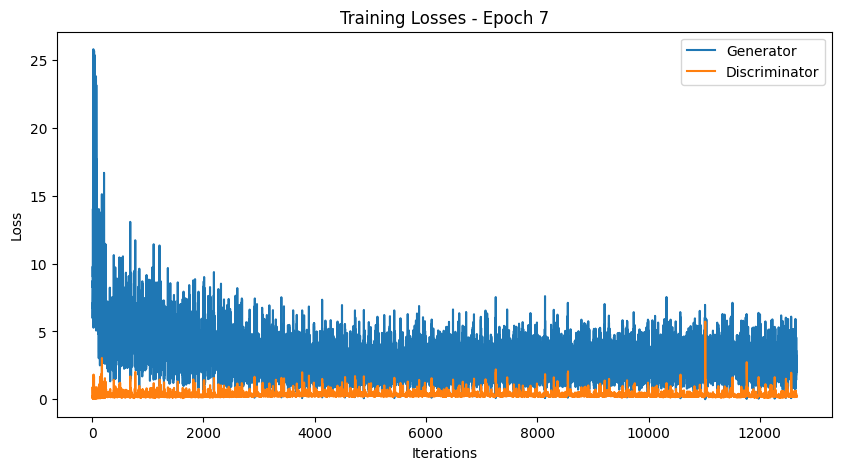

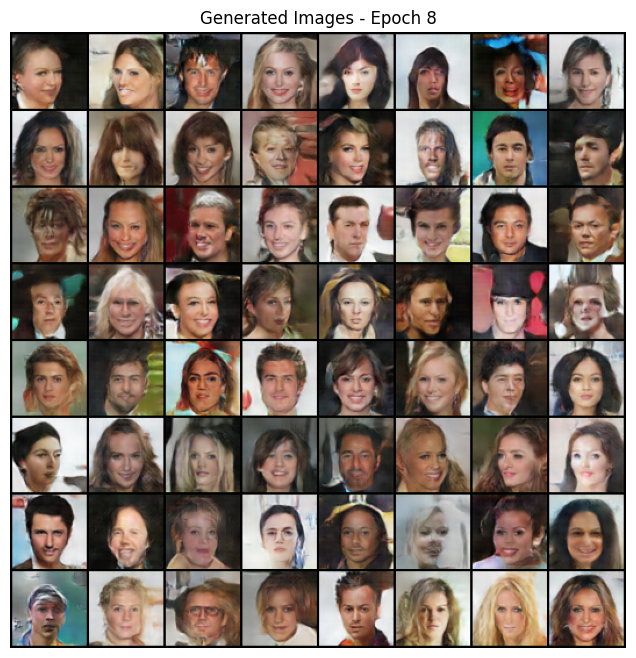

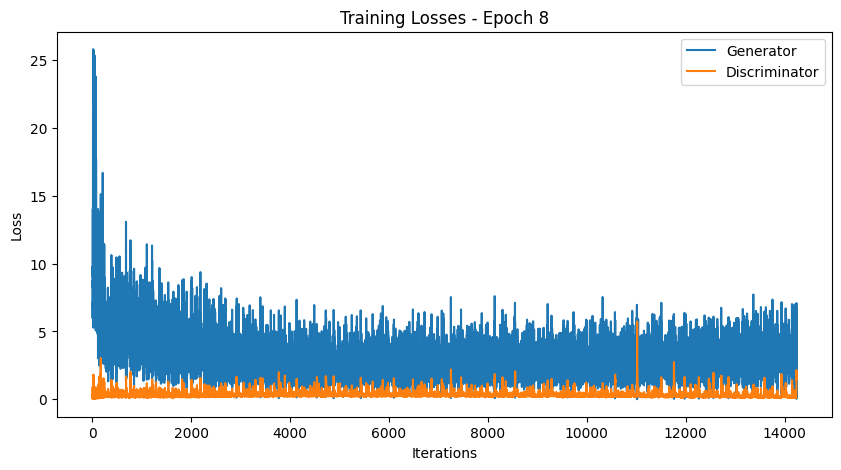

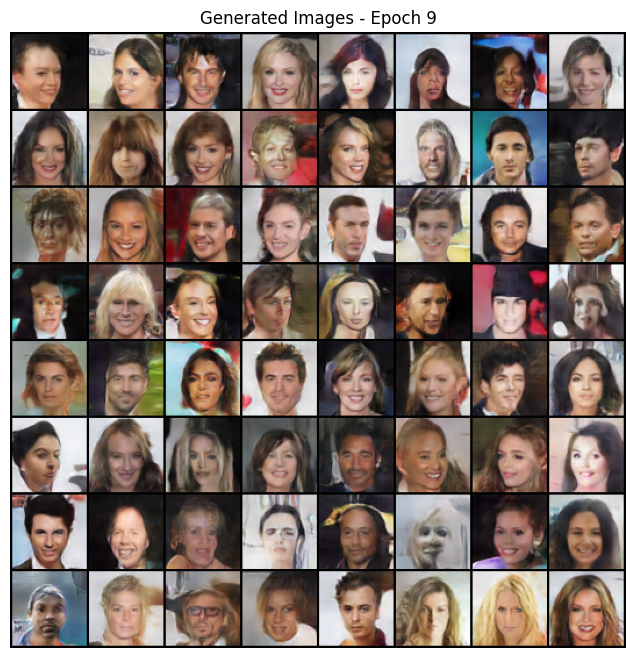

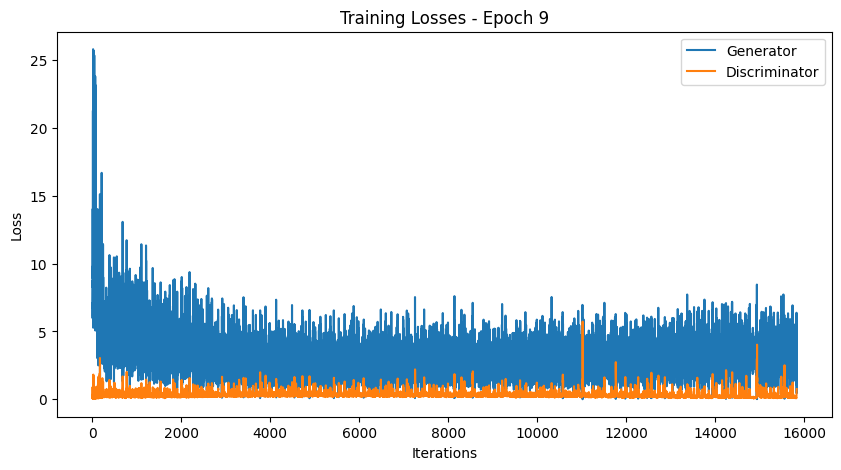

In [1]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, utils
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np

# --- 1. CONFIGURATION ---
DATASET_PATH = "/kaggle/input/celeba-dataset/img_align_celeba/img_align_celeba"
OUTPUT_DIR = "/kaggle/working/output"
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
Z_DIM, IMG_CHANNELS, FEATURE_G, FEATURE_D = 100, 3, 64, 64
BATCH_SIZE, LR, EPOCHS = 128, 0.0002, 10

os.makedirs(OUTPUT_DIR, exist_ok=True)

# --- 2. DATASET & ARCHITECTURE ---
class CelebADataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        self.image_paths = [os.path.join(root_dir, f) for f in os.listdir(root_dir) if f.endswith('.jpg')]
    def __len__(self): return len(self.image_paths)
    def __getitem__(self, idx):
        img = Image.open(self.image_paths[idx]).convert('RGB')
        return self.transform(img) if self.transform else img

def weights_init(m):
    if isinstance(m, (nn.Conv2d, nn.ConvTranspose2d)):
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif isinstance(m, nn.BatchNorm2d):
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

class Generator(nn.Module):
    def __init__(self):
        super().__init__()
        self.model = nn.Sequential(
            nn.ConvTranspose2d(Z_DIM, FEATURE_G*8, 4, 1, 0, bias=False), nn.BatchNorm2d(FEATURE_G*8), nn.ReLU(True),
            nn.ConvTranspose2d(FEATURE_G*8, FEATURE_G*4, 4, 2, 1, bias=False), nn.BatchNorm2d(FEATURE_G*4), nn.ReLU(True),
            nn.ConvTranspose2d(FEATURE_G*4, FEATURE_G*2, 4, 2, 1, bias=False), nn.BatchNorm2d(FEATURE_G*2), nn.ReLU(True),
            nn.ConvTranspose2d(FEATURE_G*2, FEATURE_G, 4, 2, 1, bias=False), nn.BatchNorm2d(FEATURE_G), nn.ReLU(True),
            nn.ConvTranspose2d(FEATURE_G, IMG_CHANNELS, 4, 2, 1, bias=False), nn.Tanh()
        )
    def forward(self, z): return self.model(z)

class Discriminator(nn.Module):
    def __init__(self):
        super().__init__()
        self.model = nn.Sequential(
            nn.Conv2d(IMG_CHANNELS, FEATURE_D, 4, 2, 1, bias=False), nn.LeakyReLU(0.2, True),
            nn.Conv2d(FEATURE_D, FEATURE_D*2, 4, 2, 1, bias=False), nn.BatchNorm2d(FEATURE_D*2), nn.LeakyReLU(0.2, True),
            nn.Conv2d(FEATURE_D*2, FEATURE_D*4, 4, 2, 1, bias=False), nn.BatchNorm2d(FEATURE_D*4), nn.LeakyReLU(0.2, True),
            nn.Conv2d(FEATURE_D*4, FEATURE_D*8, 4, 2, 1, bias=False), nn.BatchNorm2d(FEATURE_D*8), nn.LeakyReLU(0.2, True),
            nn.Conv2d(FEATURE_D*8, 1, 4, 1, 0, bias=False), nn.Sigmoid()
        )
    def forward(self, img): return self.model(img).view(-1, 1)

# --- 3. PLOTTING UTILITIES ---
def plot_results(g_losses, d_losses, epoch):
    plt.figure(figsize=(10,5))
    plt.title(f"Training Losses - Epoch {epoch}")
    plt.plot(g_losses, label="Generator")
    plt.plot(d_losses, label="Discriminator")
    plt.xlabel("Iterations")
    plt.ylabel("Loss")
    plt.legend()
    plt.savefig(os.path.join(OUTPUT_DIR, f"loss_epoch_{epoch}.png"))
    plt.show()

def show_generated_images(gen, fixed_noise, epoch):
    gen.eval()
    with torch.no_grad():
        fake_imgs = gen(fixed_noise).detach().cpu()
    gen.train()
    grid = utils.make_grid(fake_imgs, padding=2, normalize=True)
    plt.figure(figsize=(8,8))
    plt.axis("off")
    plt.title(f"Generated Images - Epoch {epoch}")
    plt.imshow(np.transpose(grid, (1, 2, 0)))
    plt.savefig(os.path.join(OUTPUT_DIR, f"faces_epoch_{epoch}.png"))
    plt.show()

# --- 4. TRAINING EXECUTION ---
transform = transforms.Compose([
    transforms.Resize(64), transforms.CenterCrop(64),
    transforms.ToTensor(), transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
])

dataset = CelebADataset(DATASET_PATH, transform)
dataloader = DataLoader(dataset, batch_size=BATCH_SIZE, shuffle=True)

gen, disc = Generator().to(DEVICE), Discriminator().to(DEVICE)
gen.apply(weights_init); disc.apply(weights_init)

opt_gen = optim.Adam(gen.parameters(), lr=LR, betas=(0.5, 0.999))
opt_disc = optim.Adam(disc.parameters(), lr=LR, betas=(0.5, 0.999))
criterion = nn.BCELoss()

fixed_noise = torch.randn(64, Z_DIM, 1, 1).to(DEVICE)
G_losses, D_losses = [], []

print("Starting Training...")
for epoch in range(EPOCHS):
    for i, real in enumerate(dataloader):
        real = real.to(DEVICE)
        b_size = real.size(0)
        
        # Train Discriminator
        disc.zero_grad()
        label_r, label_f = torch.ones(b_size, 1).to(DEVICE), torch.zeros(b_size, 1).to(DEVICE)
        loss_r = criterion(disc(real), label_r)
        fake = gen(torch.randn(b_size, Z_DIM, 1, 1).to(DEVICE))
        loss_f = criterion(disc(fake.detach()), label_f)
        loss_d = (loss_r + loss_f) / 2
        loss_d.backward(); opt_disc.step()

        # Train Generator
        gen.zero_grad()
        loss_g = criterion(disc(fake), label_r)
        loss_g.backward(); opt_gen.step()

        G_losses.append(loss_g.item())
        D_losses.append(loss_d.item())

    # Visual Output per Epoch
    show_generated_images(gen, fixed_noise, epoch)
    plot_results(G_losses, D_losses, epoch)
    torch.save(gen.state_dict(), os.path.join(OUTPUT_DIR, "generator_latest.pth"))